In [1]:
! pip install --upgrade --force-reinstall --no-deps kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 58 kB 1.1 MB/s 
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73051 sha256=08892e344f9a6fc676e872021ff0490149b75ac6ce02da8d473d1b06740a5316
  Stored in directory: /root/.cache/pip/wheels/62/d6/58/5853130f941e75b2177d281eb7e44b4a98ed46dd155f556dc5
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.12
    Uninstalling kaggle-1.5.12:
      Successfully uninstalled kaggle-1.5.12


In [ ]:
!mkdir -p /root/.kaggle

In [ ]:


! mv kaggle.json /root/.kaggle

In [ ]:
! kaggle competitions download -c plant-pathology-2020-fgvc7

 99% 774M/779M [00:06<00:00, 128MB/s]
100% 779M/779M [00:06<00:00, 122MB/s]


In [ ]:
! unzip -q /content/plant-pathology-2020-fgvc7.zip

In [ ]:
% load_ext tensorboard

1.A Plant Pathology client is working on identifying diseases impacting agricultural crops. They have a dataset of crop images with labels of diseases impacting them. Dataset can be found here: a. Create an EDA report for the above stated problem, outlining what & why of your approach?



In [ ]:
import pandas as pd
train=pd.read_csv("train.csv")

In [ ]:
train.image_id=train.image_id+".jpg"

In [ ]:
labels=[]
for i in range(len(train)):
  if train.loc[i,"healthy"]==1:
    labels.append("healthy")
  elif   train.loc[i,"multiple_diseases"]==1:
    labels.append("multiple_diseases")
  elif   train.loc[i,"rust"]==1:
    labels.append("rust")
  else:
    labels.append("scab")



In [ ]:
train["label"]=labels

In [ ]:
train

,image_id,healthy,multiple_diseases,rust,scab,label
0,Train_0.jpg,0,0,0,1,scab
1,Train_1.jpg,0,1,0,0,multiple_diseases
2,Train_2.jpg,1,0,0,0,healthy
3,Train_3.jpg,0,0,1,0,rust
4,Train_4.jpg,1,0,0,0,healthy
...,...,...,...,...,...,...
1816,Train_1816.jpg,0,0,0,1,scab
1817,Train_1817.jpg,1,0,0,0,healthy
1818,Train_1818.jpg,1,0,0,0,healthy
1819,Train_1819.jpg,0,0,1,0,rust


In [ ]:
# no of plants in each category
train.iloc[:,1:5].sum()

healthy              516
multiple_diseases     91
rust                 622
scab                 592
dtype: int64

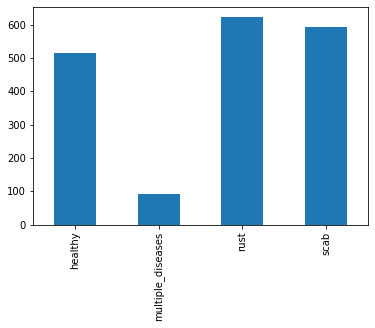

In [ ]:
# The plants having multiple disease is relatively less than the plants that are healthy and with rust and scabs.
# There is an imbalance in the data set
import matplotlib.pyplot as plt

train.iloc[:,1:5].sum().plot.bar()

# This data is highly imbalanced as there is a huge difference in
# the number of images with scabs 

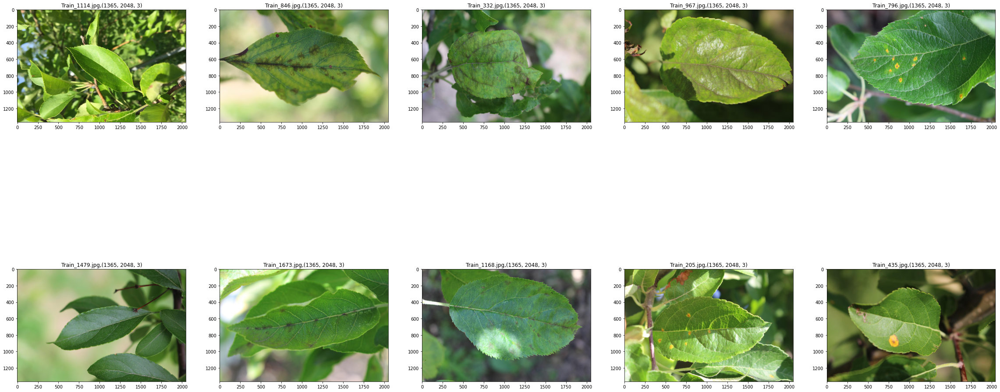

In [ ]:
#Looking at 10 random images 

import cv2
import matplotlib.pyplot as plt
import numpy as np
num=np.random.choice(train.image_id,10)

c=1
plt.figure(figsize=(40,20))
for n in num:
  plt.subplot(2,5,c)
  image=cv2.imread("/content/images/"+n)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f"{n},{image.shape}")
  c+=1




In [ ]:
# Looking at 10 random images of plants with scabs

scabs=train["image_id"][train.scab==1].reset_index()
scabs

num=np.random.choice(scabs.image_id,10)

c=1
plt.figure(figsize=(40,20))
for n in num:
  plt.subplot(2,5,c)
  image=cv2.imread("/content/images/"+n)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f"{n},{image.shape}")
  c+=1

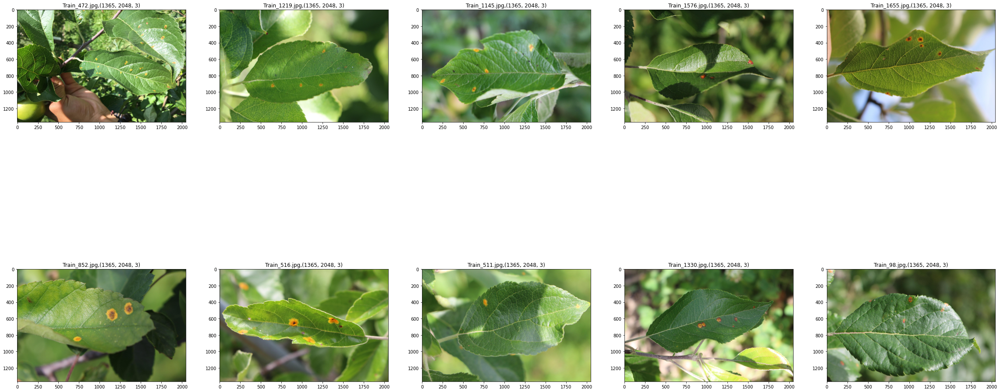

In [ ]:
# Looking at 10 random images of plants with rusts

rusts=train["image_id"][train.rust==1].reset_index()
rusts

num=np.random.choice(rusts.image_id,10)

c=1
plt.figure(figsize=(40,20))
for n in num:
  plt.subplot(2,5,c)
  image=cv2.imread("/content/images/"+n)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f"{n},{image.shape}")
  c+=1


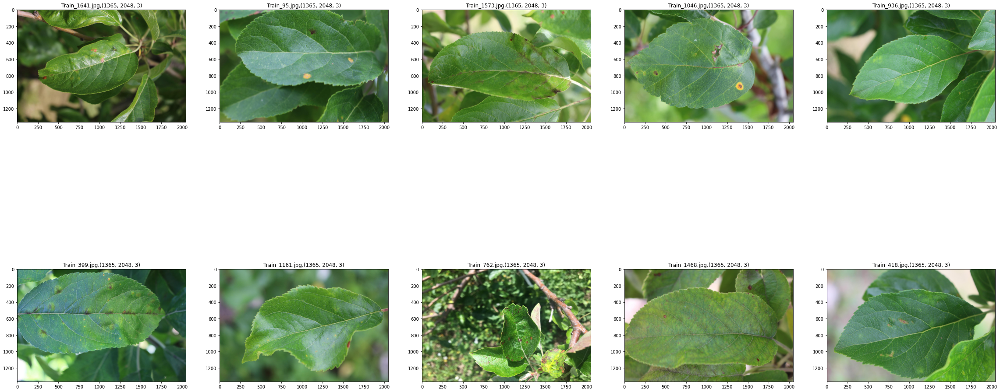

In [ ]:
# Looking at 10 random images of plants with multiple diseases

md=train["image_id"][train.multiple_diseases==1].reset_index()


num=np.random.choice(md.image_id,10)

c=1
plt.figure(figsize=(40,20))
for n in num:
  plt.subplot(2,5,c)
  image=cv2.imread("/content/images/"+n)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f"{n},{image.shape}")
  c+=1


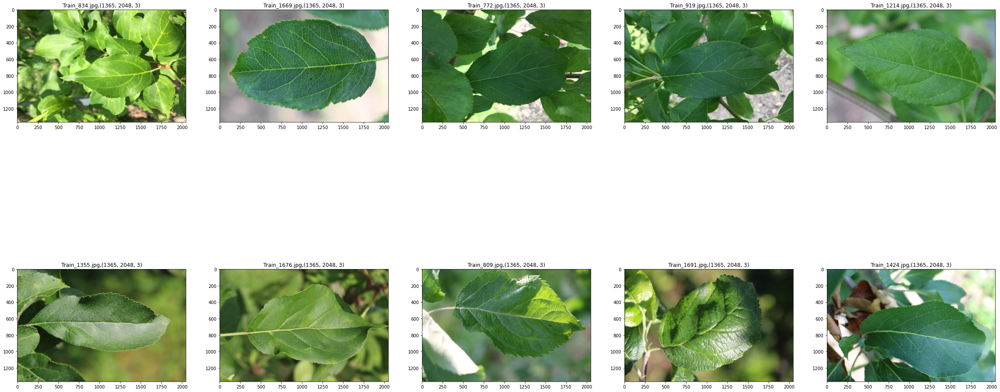

In [ ]:
# Looking at 10 random images of healthy leaves

h=train["image_id"][train.healthy==1].reset_index()
h

num=np.random.choice(h.image_id,10)

c=1
plt.figure(figsize=(40,20))
for n in num:
  plt.subplot(2,5,c)
  image=cv2.imread("/content/images/"+n)
  image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f"{n},{image.shape}")
  c+=1


In [ ]:
im_shape=np.array(l)

print(f'The mean height is : {round(im_shape.mean(axis=0)[0])}, The mean width is: {round(im_shape.mean(axis=0)[1])}')

2.	A Plant Pathology client is working on identifying diseases impacting agricultural crops. They have a dataset of crop images with labels of diseases impacting them. But the client is unable to provide more images (as requested by you) for training:
a.	What is the typical routine you will follow here (when data is scarce) 
b.	What are the basic augmentation techniques you can follow here, please explain how and why they are useful (for plant leaf images) ?  
c.	Try to use augmentation packages other than ImagDataGenerator from keras, example - `imgaug` 


a.When data is scarce we will use data augmentation to incorporate more randomness into our data. 

b. I have used Keras's Image Data Generator to augment images. The techniques that I have used are described below:

**Rotation range:** 

Image rotation is one of the widely used augmentation techniques and allows the model to become invariant to the orientation of the object.

**Fill mode:**

When the image is rotated, some pixels will move outside the image and leave an empty area that needs to be filled in. We can fill this are by the pixel values of the neartest pixels. This is specified in the fill_mode argument and the default value is “nearest” which simply replaces the empty area with the nearest pixel values.


**vertical_flip:**

Flipped the image along the vertcal axis. Since the images we are dealing with are symmetrical, this process might be of interest. 

**horizontal_flip:**

Flipped the image alomg it's horizontal axis. this produces mirror images.


**width_shift_range and height_shift_range:** 
Making sure that the object of interest is at the centre of the image.

**brightness_range:**

It randomly changes the brightness of the image. It is also a very useful augmentation technique because most of the time our object will not be under perfect lighting condition. So, it becomes imperative to train our model on images under different lighting conditions.


**zoom_range:**

Zoomed in on the image

**shear_range:**

Distorted the image a bit so that  so that computers can see how humans see things from different angles.


In [ ]:
#c. # imgaug 
import imageio
import imgaug as ia
import imgaug.augmenters as iaa


In [ ]:
# Flipping with imgaug
#Horizontally flipped
hflip= iaa.Fliplr(p=1.0)
hflipped_image2= hflip.augment_image(image)

#Vertically flipped
vflip= iaa.Flipud(p=1.0) 
vflipped_image2= vflip.augment_image(image)

3.	Iterate over and try different architecture and topologies and preserve the results of each experiment using TensorBoard. Also, save major metrics in an Excel (or try W&B).

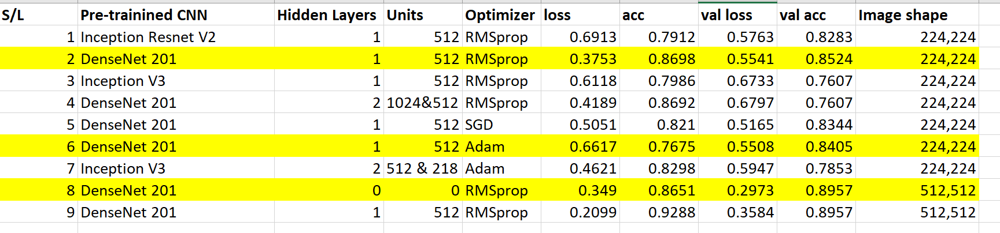

**Observations:**

 

1.   DenseNet 201 as the pretrained CNN is
generating the best results when compared to the other models that I have considered.
2.  Considering a bigger image size (512,512) yields better accuracy.
3. The accuracy of the model is indepenent of the use of hidden layers. I am getting thesame accuracy w/o a hidden layer. 
4. RMSprop is a better optimizer when it comes to using DenseNet 201 as my pre-trained CNN.


**FINAL MODEL**

DenseNet 121

Batch size=16

Input Image shape : (512,512,3)

In [ ]:
# Split the train set into train and test set

from sklearn.model_selection import train_test_split
train,test=train_test_split(train,test_size=0.1)

In [ ]:
import tensorflow as tf
idg = tf.keras.preprocessing.image.ImageDataGenerator(
    
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=.1,
    fill_mode='nearest',
    shear_range=0.1,
    brightness_range=[0.5, 1.5],
    validation_split=0.1,
    rescale=1./255)

In [ ]:
input_shape=(512,512,3)
img_size=(512,512)
batch_size=16
train_gen = idg.flow_from_dataframe(
                train, directory = '/content/images',
                target_size = img_size,
                x_col = 'image_id',
                y_col = ['healthy','multiple_diseases','rust','scab'],
                class_mode='raw',
                subset='training',
                batch_size = batch_size
)



Found 1475 validated image filenames.


In [ ]:
val_gen=idg.flow_from_dataframe(train,directory="/content/images",
                                  target_size=(512,512),
                                  x_col="image_id",
                                  y_col="label",
                                  subset="validation",
                                batch_size=batch_size)                  

Found 163 validated image filenames belonging to 4 classes.


In [ ]:
import tensorflow as tf
dense=tf.keras.applications.densenet.DenseNet121(include_top=False,
                                               weights='imagenet',
                                               input_shape=input_shape
                                          )

29097984/29084464 [==============================] - 0s 0us/step


In [ ]:
for layer in dense.layers:
  layer.trainable=False

In [ ]:
del model

In [ ]:
x=dense.output
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.GlobalAveragePooling2D()(x)
#x=tf.keras.layers.Dense(512,activation="relu")(x)
x=tf.keras.layers.Dropout(0.2)(x)
pred=tf.keras.layers.Dense(4,activation="softmax")(x)
model=tf.keras.Model(inputs=dense.input,outputs=pred)

In [ ]:
model.compile(tf.keras.optimizers.RMSprop(),
              loss="categorical_crossentropy",
              metrics=["acc"])

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=5)
redu_lr=tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.001)
tftb=tf.keras.callbacks.TensorBoard(log_dir="logs")


In [ ]:
% tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
hist=model.fit(train_gen,validation_data=val_gen,epochs=30,batch_size=batch_size,callbacks=[early_stopping,redu_lr,tftb])

Epoch 1/30
93/93 [==============================] - 212s 2s/step - loss: 0.9655 - acc: 0.6332 - val_loss: 0.7967 - val_acc: 0.7607 - lr: 0.0010
Epoch 2/30
93/93 [==============================] - 186s 2s/step - loss: 0.7215 - acc: 0.7729 - val_loss: 0.6344 - val_acc: 0.8405 - lr: 0.0010
Epoch 3/30
93/93 [==============================] - 183s 2s/step - loss: 0.6407 - acc: 0.7939 - val_loss: 0.5615 - val_acc: 0.8528 - lr: 0.0010
Epoch 4/30
93/93 [==============================] - 181s 2s/step - loss: 0.5721 - acc: 0.8054 - val_loss: 0.4847 - val_acc: 0.8528 - lr: 0.0010
Epoch 5/30
93/93 [==============================] - 183s 2s/step - loss: 0.5254 - acc: 0.8285 - val_loss: 0.4221 - val_acc: 0.8896 - lr: 0.0010
Epoch 6/30
93/93 [==============================] - 185s 2s/step - loss: 0.4994 - acc: 0.8346 - val_loss: 0.4167 - val_acc: 0.8528 - lr: 0.0010
Epoch 7/30
93/93 [==============================] - 181s 2s/step - loss: 0.4779 - acc: 0.8386 - val_loss: 0.4119 - val_acc: 0.8589 - lr:

In [ ]:
model.save("Plant")

INFO:tensorflow:Assets written to: Plant/assets


In [ ]:
new_model=tf.keras.models.load_model("Plant")

In [ ]:
test=test.reset_index()
test

,index,image_id,healthy,multiple_diseases,rust,scab,label
0,820,Train_820.jpg,0,0,0,1,scab
1,1058,Train_1058.jpg,1,0,0,0,healthy
2,1217,Train_1217.jpg,0,0,0,1,scab
3,1077,Train_1077.jpg,0,0,0,1,scab
4,1134,Train_1134.jpg,0,1,0,0,multiple_diseases
...,...,...,...,...,...,...,...
178,1623,Train_1623.jpg,0,0,0,1,scab
179,1605,Train_1605.jpg,1,0,0,0,healthy
180,1686,Train_1686.jpg,0,0,1,0,rust
181,673,Train_673.jpg,0,0,0,1,scab


In [ ]:
actual_labels=[]
for i in range(len(test)):
  if test.loc[i,"label"]=="healthy":
    actual_labels.append(0)
  elif   test.loc[i,"label"]=="multiple_diseases":
    actual_labels.append(1)
  elif   test.loc[i,"label"]=="rust":
    actual_labels.append("2")
  else:
    actual_labels.append("3")


In [ ]:
test["actual"]=actual_labels
test.actual=test.actual.astype("int")

In [ ]:
test

,index,image_id,healthy,multiple_diseases,rust,scab,label,actual
0,820,Train_820.jpg,0,0,0,1,scab,3
1,1058,Train_1058.jpg,1,0,0,0,healthy,0
2,1217,Train_1217.jpg,0,0,0,1,scab,3
3,1077,Train_1077.jpg,0,0,0,1,scab,3
4,1134,Train_1134.jpg,0,1,0,0,multiple_diseases,1
...,...,...,...,...,...,...,...,...
178,1623,Train_1623.jpg,0,0,0,1,scab,3
179,1605,Train_1605.jpg,1,0,0,0,healthy,0
180,1686,Train_1686.jpg,0,0,1,0,rust,2
181,673,Train_673.jpg,0,0,0,1,scab,3


In [ ]:
model.input_shape

(None, 512, 512, 3)

In [ ]:
import cv2
import numpy as np
predicted_labels=[]
for i in range(len(test)):
 image=test.loc[i,"image_id"]
 image=cv2.cvtColor(cv2.imread("images/"+image),cv2.COLOR_BGR2RGB)
 image=image/255.0  # data preprocessing
 image=cv2.resize(image,(512,512))
 image=np.expand_dims(image,axis=0)
 predicted_labels.append(np.argmax(model.predict(image)))

In [ ]:
predicted_labels

In [ ]:
test["pred"]=predicted_labels

In [ ]:
test

,index,image_id,healthy,multiple_diseases,rust,scab,label,actual,pred
0,820,Train_820.jpg,0,0,0,1,scab,3,3
1,1058,Train_1058.jpg,1,0,0,0,healthy,0,0
2,1217,Train_1217.jpg,0,0,0,1,scab,3,3
3,1077,Train_1077.jpg,0,0,0,1,scab,3,3
4,1134,Train_1134.jpg,0,1,0,0,multiple_diseases,1,1
...,...,...,...,...,...,...,...,...,...
178,1623,Train_1623.jpg,0,0,0,1,scab,3,3
179,1605,Train_1605.jpg,1,0,0,0,healthy,0,0
180,1686,Train_1686.jpg,0,0,1,0,rust,2,2
181,673,Train_673.jpg,0,0,0,1,scab,3,3


4.	For the above prepared model prepare a classification report with major metrics (confusion metric, recall, precision., etc) on the test data.  

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

confusion_matrix(test.pred,test.actual) # Confusion Matrix


        

array([[43,  2,  2,  2],
       [ 0,  5,  0,  1],
       [ 1,  2, 64,  1],
       [ 1,  1,  0, 58]])

In [ ]:
accuracy_score(test.actual,test.pred)

0.9289617486338798

In [ ]:
print(classification_report(test.pred,test.actual)) # Classification report

              precision    recall  f1-score   support

           0       0.96      0.88      0.91        49
           1       0.50      0.83      0.62         6
           2       0.97      0.94      0.96        68
           3       0.94      0.97      0.95        60

    accuracy                           0.93       183
   macro avg       0.84      0.90      0.86       183
weighted avg       0.94      0.93      0.93       183



5.	For the above problem statement, save the model and re-use it in another Collab sheet and perform a prediction. For prediction, create a separate function which will expect an input image and output the prediction label (with confidence).

Prediction with the saved model

In [ ]:
def prediction (input_image):
 image=cv2.cvtColor(cv2.imread("images/"+input_image),cv2.COLOR_BGR2RGB)
 image=image/255.0  # data preprocessing
 image=cv2.resize(image,(512,512))
 image=np.expand_dims(image,axis=0)

 z=np.argmax(new_model.predict(image))
 actual=test[test.image_id==input_image].actual
 actual=np.array(actual)
 acc_score=accuracy_score(actual,np.array([z]))
 
 

 if z==0:
   print("The leaf is healthy!")
 elif z==1:
   print("The leaf has multiple diseases!")
 elif z==2:
    print("The leaf has rust")	
 else:
   print("The leaf has scabs")
 print("The accuracy of prediction is:",acc_score)  


In [ ]:
prediction ("Train_820.jpg")

The leaf has scabs
The accuracy of prediction is: 1.0
